# Week 6<br>Web Scraping

Oct 6, 2019

## Housekeeping

- Homework #3 (required) due on Thursday
- Homework #4 (optional) assigned on Thursday
- You must complete one of homeworks #4, #5, and #6
- Final project due at the end of the final period...more details soon

## The roadmap

- Last time: APIs, Twitter, Census data
- Today: web scraping
- Next: big data, geo data science in the wild, machine learning, interactive web maps, dashboarding & web servers

The final project will ask you to combine several of these topics/techniques to analyze a data sets and produce a web-based data visualization

## Today: web scraping

- Why web scraping? 
- Getting familiar with the Web
- Web scraping: extracting data from static sites
- How to deal with dynamic content

## What is web scraping? 


Using software to gather and extract data/content from websites

## Why is web scraping useful? 

- Not every data source provides an API
- The Web contains **a lot** of information
- Unique data sources that may not be available elsewhere

## What is possible: 11 million rental listings from Craigslist


<center>
<img src=attachment:01-craigslist-rental-housing-listings-us-map.jpg width=700></img>
</center>
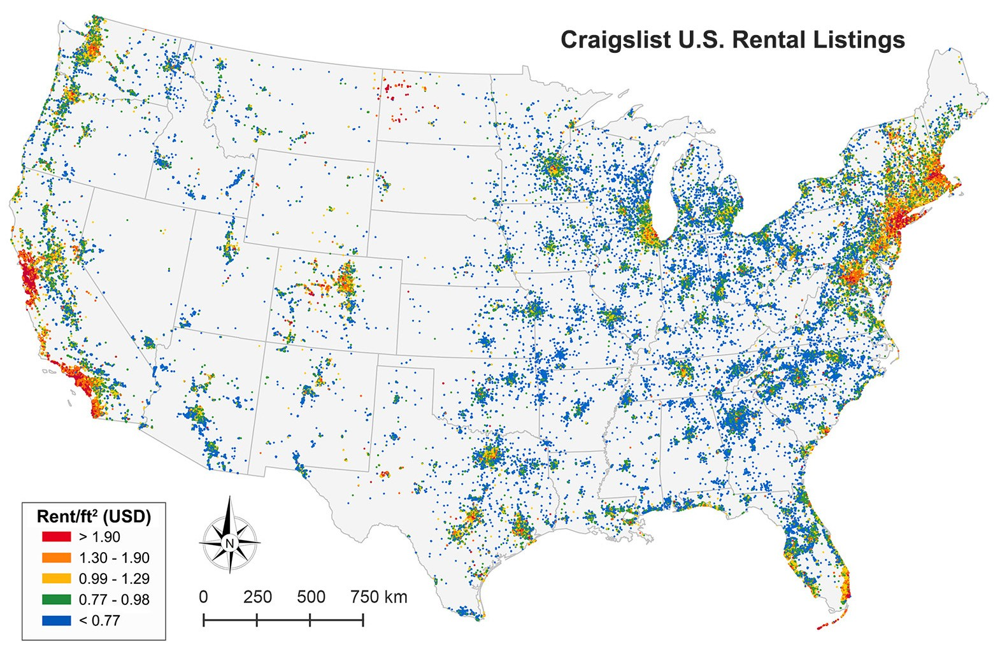

[Source: Geoff Boeing](https://geoffboeing.com/2016/08/craigslist-rental-housing-insights/)

## Why isn't web scraping incredibly popular?

- It can be time consuming and difficult to extract large volumes 
- You are at the mercy of website maintainers — if the website structure changes, your code breaks
- Most importantly, there are ethical and legal concerns

<center>
    <img src=attachment:Screen%20Shot%202019-03-12%20at%208.42.41%20PM.png width=700></img>
</center>
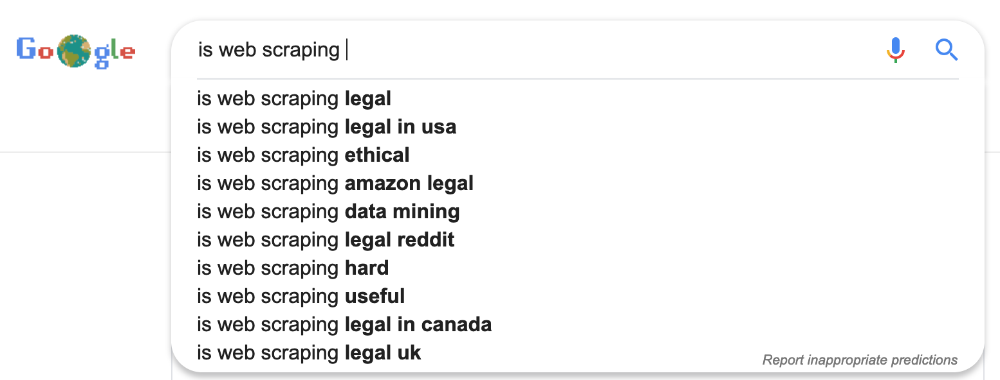

## Legal concerns

RadPad scraped the entirety of Craiglist, Craigslist sued RadPad, and they were [awarded $60 million](http://labusinessjournal.com/news/2017/apr/14/radpad-ordered-pay-605-million-judgment-craigslist/)

<center>
<img src=attachment:Picture1.png width=500></img>
</center>
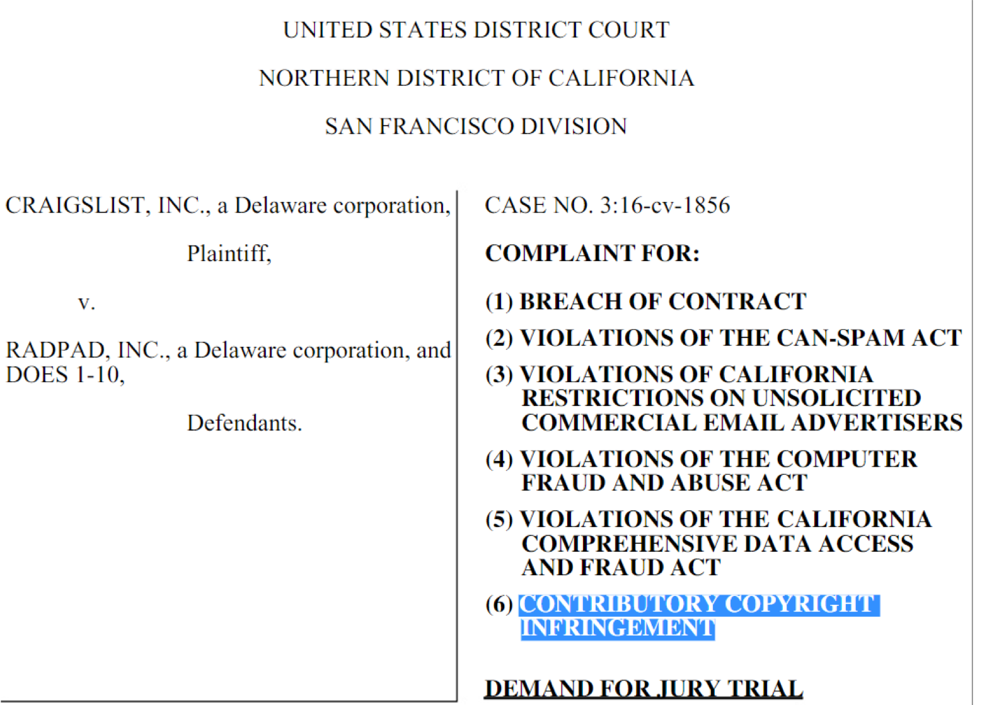

## Two types of legal issues

1. Copyright infringement
    - For example: pictures, rental listing text
2. Terms of Use violations
    - **Unauthorized**: Is scraping prohibited in the website’s terms of use?
    - **Intentional**: Was the person aware of the terms? Did they check an “I agree to these terms” box?
    - **Causes damage**: Did the scraping overload the website, blocking user access?


## When is web scraping probably okay?

- .gov sites and, to a lesser degree, .edu sites
- Website owner has no business reason to protect the information
- Not prohibited in terms of use
- Limited number of requests
- Not too many requests all at once
- Done at night, when web traffic is low


## When is it less likely to be okay?

- search engines
- E-commerce sites (e.g. Zillow, Expedia, Amazon)
- Social media
- Prohibited in terms of use
- Large number of requests
- High frequency of requests

## With that being said, let's do some web scraping

## A primer on Web definitions

So many acronyms:

- HTML
- The DOM
- CSS

## HTML: HyperText Markup Language

- The language most websites are written in
- The browser knows how to read this language and renders the output for you
- HTML is what a web crawler will see

## HTML tags

- There are a standard set of tags to define the different structural components of a webpage
- For example: 
    - `<h1>`, `<h2>` tags define headers
    - `<p>` tags define paragraphs
    - `<ol>` and `<ul>` are orderered and unordered lists

## Jupyter notebooks can render HTML

Use the `%%html` magic cell command

In [1]:
%%html

<html>
  <head>
    <title>TITLE GOES HERE</title>
  </head>
  <body>
    <h5>MAIN CONTENT GOES IN THE BODY TAG</h5>
    <p>This is a paragraph tag</p>
  </body>
</html>

## HTML: elements, tags, and attributes

Learning the notation:

In [2]:
%%html

<a id="my-link" style="color: orange;" href="https://www.design.upenn.edu" target="blank_">This is my link</a>

**The element:** 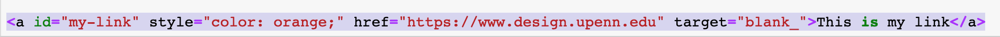

**The tag:**
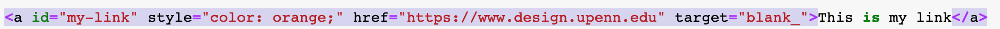

**The attributes:**

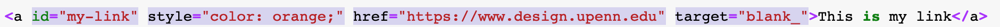

## Some attributes have special meaning

- In particular: `id` and `class`
- Allows you to: 
    - select and manipulate specific elements
    - apply styling to specific types of elements

## CSS: Cascading Stylesheets

- A language for styling HTML pages
- CSS styles (also known as selectors) are applied to HTML tags based on their name, class, or ID.

<center>
    <img src=attachment:Screen%20Shot%202019-03-12%20at%209.30.19%20PM.png width=1200></img>
</center>
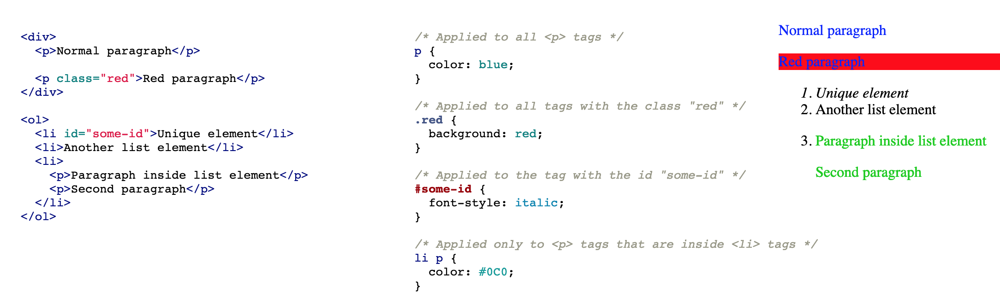

## Basic Web selectors

- Class
    - e.g., `.red`
- ID
    - e.g., `#some-id`
- Tag
    - e.g., `p`, `li`, `div`

- **IDs:** unique identifiers
    - no two elements on a page will have the same ID.
- **Classes:** not unique
    - many elements will have the same class
    - a single element can have multiple classes

And many more: look up the syntax when you need it

https://www.w3schools.com/cssref/css_selectors.asp

## Finally: dynamic content

## The DOM: Document Object Model

- An interactive object tree created from the HTML tag hierarchy on a page
- Created by the browser
- Tracks user interactions
- It is **dynamic**: stores the current state of the webpage 

## Step 1: Inspecting a webpage

- Modern web browsers provide tools for inspecting the source HTML and DOM of websites
- Also tells you data sources that have been loaded by the page
- This should also be your first step when starting to scrape a page

**Simply hit F12 to load the Web Inspector**

<center>
    <img src=attachment:Screen%20Shot%202019-10-02%20at%209.48.53%20PM.png width=800></img>
</center>
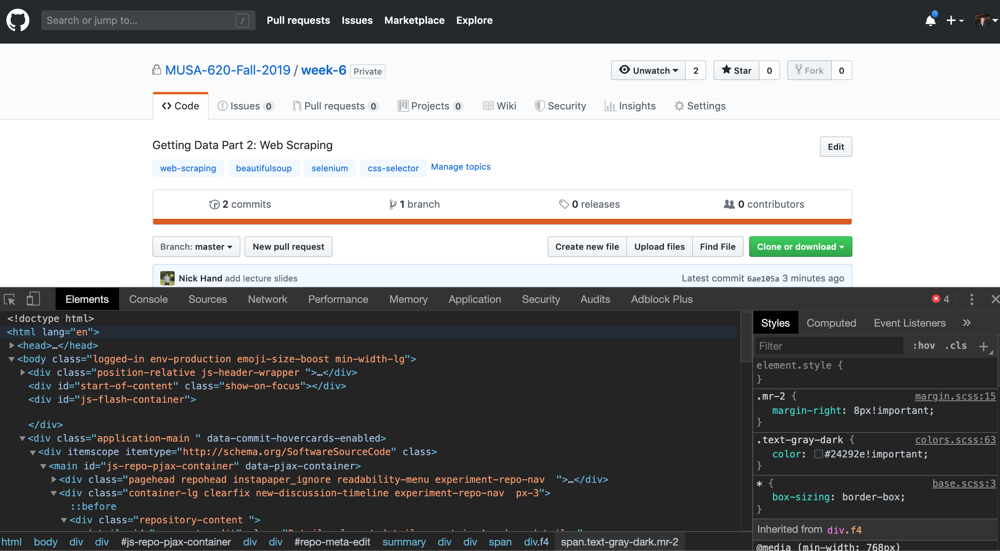

## The Elements tab

- Allows you to inspect the DOM directly
- The tool that will allow you to identify what data you want to scrape from a website

## The Elements tab

<center>
    <img src=attachment:Screen%20Shot%202019-10-02%20at%209.51.22%20PM.png width=900/>
</center>
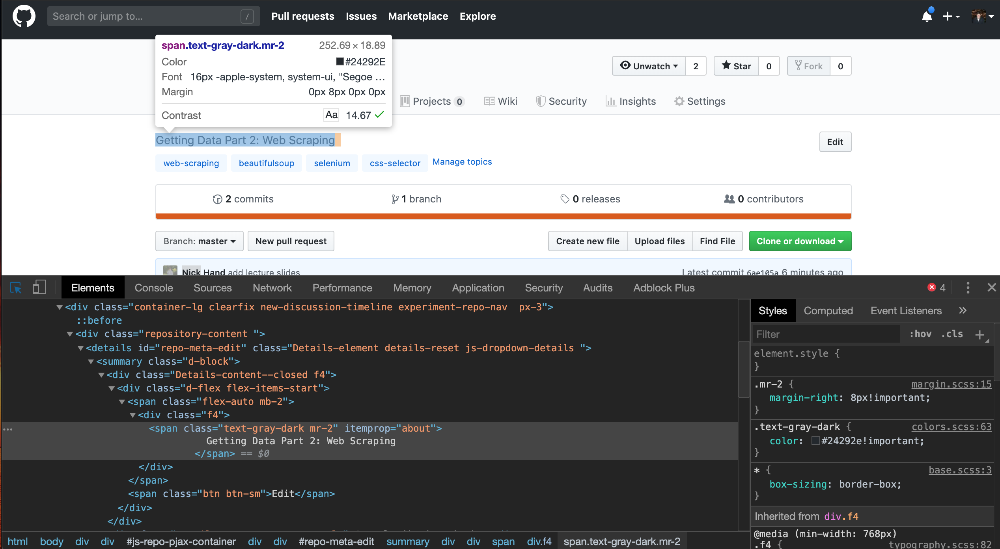

## The Elements tab

1. Right click on the element you want to view
2. Click on "Inspect"
3. The element will be highlighted in the DOM (in the Elements tab)

## Finding hidden data URLs

The DOM will often include URLs for images or video files that you can use to download the raw data. 

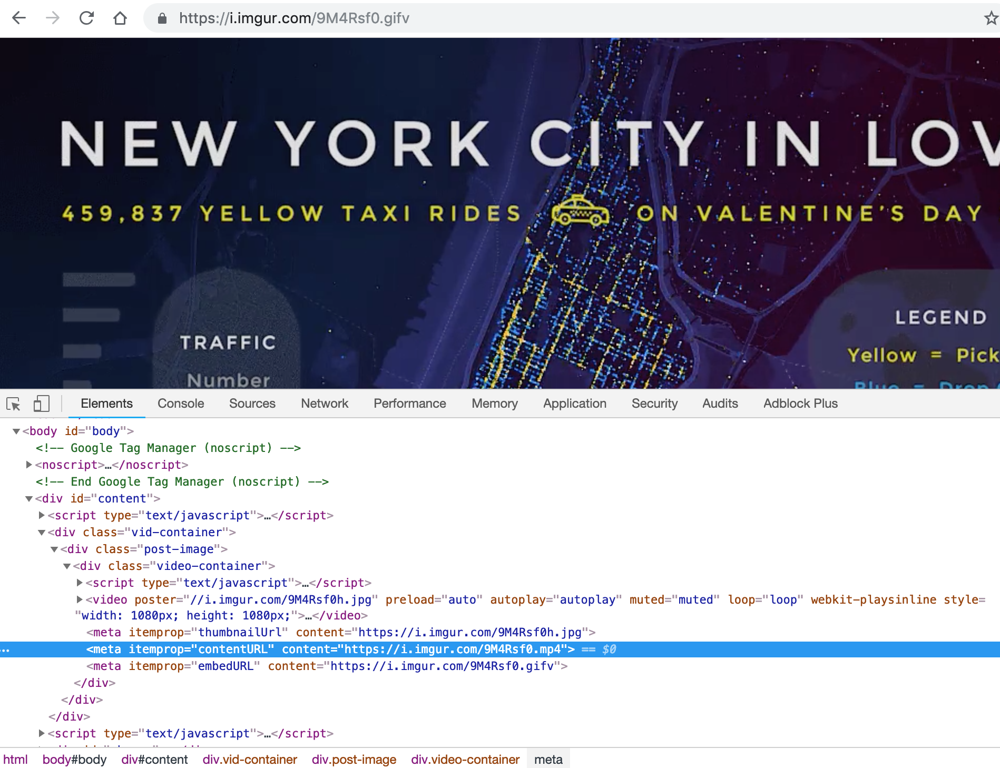

[Source](https://i.imgur.com/9M4Rsf0.gifv)

## The Network Tab

- Shows you all files downloaded by the webpage after the HTML loaded (FYI: these are called AJAX requests)
- Select either `JS` or `XHR` (XML HTTP requests)

**Usually looking for `.json` files for GeoJSON data**

## Example 1: [Interactive maps from the Inquirer](http://data.philly.com/philly/crime/)

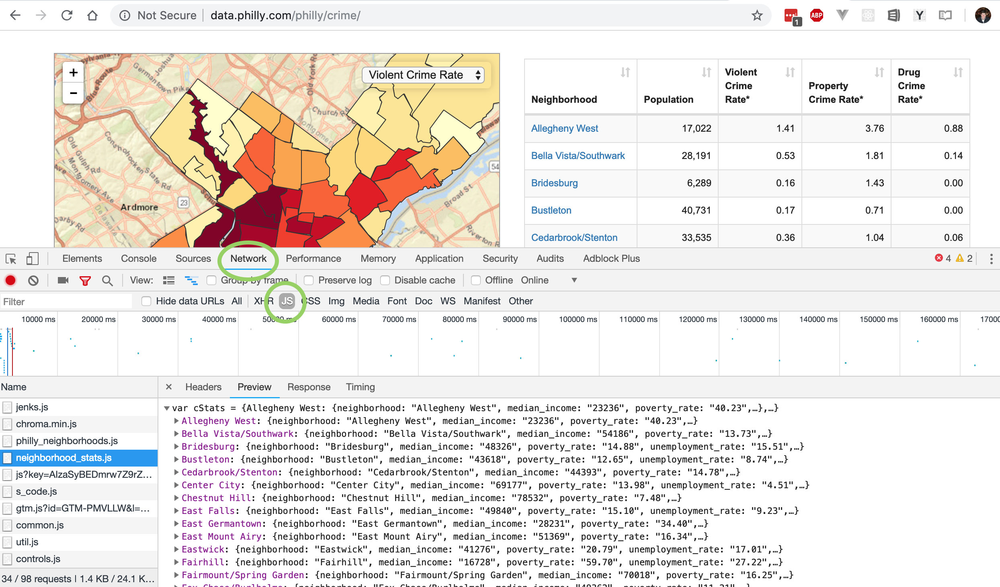

## Example 2: [Measles data from the WSJ](http://graphics.wsj.com/infectious-diseases-and-vaccines/)

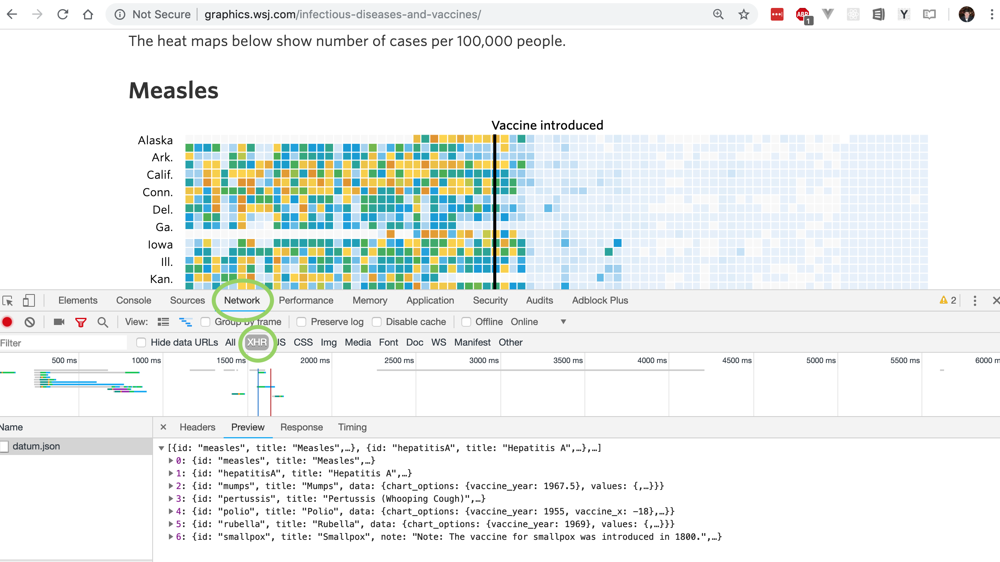

## Web scraping: when inspecting is not enough

## Web Scraping in Python

The most common packages: 

- **requests**: utilities for requesting HTML from a website
- **beautifulsoup4**: utilities for parsing HTML and extracting specific elements/data

With these packages, we can: 

- Request the HTML of web pages
- Parse HTML and extract the data we want

## Let's explore [AllSides](https://www.allsides.com/media-bias/media-bias-ratings)

<center>
    <img src=attachment:Screen%20Shot%202019-03-12%20at%2011.11.05%20PM.png width=800>
<center>
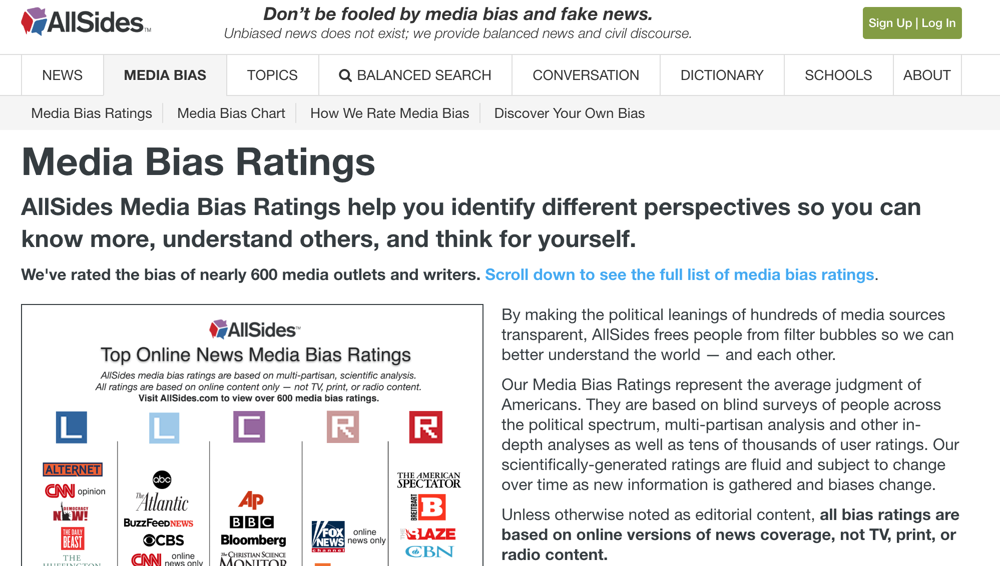

## Getting the HTML content

In [9]:
import requests

url = 'https://www.allsides.com/media-bias/media-bias-ratings'
r = requests.get(url)
print(r.content)

b'<!DOCTYPE html>\n<!--[if IEMobile 7]><html class="iem7"  lang="en" dir="ltr"><![endif]-->\n<!--[if lte IE 6]><html class="lt-ie9 lt-ie8 lt-ie7"  lang="en" dir="ltr"><![endif]-->\n<!--[if (IE 7)&(!IEMobile)]><html class="lt-ie9 lt-ie8"  lang="en" dir="ltr"><![endif]-->\n<!--[if IE 8]><html class="lt-ie9"  lang="en" dir="ltr"><![endif]-->\n<!--[if (gte IE 9)|(gt IEMobile 7)]><!--><html  lang="en" dir="ltr" prefix="og: http://ogp.me/ns# article: http://ogp.me/ns/article# book: http://ogp.me/ns/book# profile: http://ogp.me/ns/profile# video: http://ogp.me/ns/video# product: http://ogp.me/ns/product# content: http://purl.org/rss/1.0/modules/content/ dc: http://purl.org/dc/terms/ foaf: http://xmlns.com/foaf/0.1/ rdfs: http://www.w3.org/2000/01/rdf-schema# sioc: http://rdfs.org/sioc/ns# sioct: http://rdfs.org/sioc/types# skos: http://www.w3.org/2004/02/skos/core# xsd: http://www.w3.org/2001/XMLSchema#"><!--<![endif]-->\n\n<head profile="http://www.w3.org/1999/xhtml/vocab">\n\n\n  <meta char

## BeautifulSoup makes this much more manageable

In [13]:
from bs4 import BeautifulSoup

In [15]:
soup = BeautifulSoup(r.content, 'html.parser')

## Making the HTML "pretty"

In [17]:
print(soup.prettify())

<!DOCTYPE html>
<!--[if IEMobile 7]><html class="iem7"  lang="en" dir="ltr"><![endif]-->
<!--[if lte IE 6]><html class="lt-ie9 lt-ie8 lt-ie7"  lang="en" dir="ltr"><![endif]-->
<!--[if (IE 7)&(!IEMobile)]><html class="lt-ie9 lt-ie8"  lang="en" dir="ltr"><![endif]-->
<!--[if IE 8]><html class="lt-ie9"  lang="en" dir="ltr"><![endif]-->
<!--[if (gte IE 9)|(gt IEMobile 7)]><!-->
<html dir="ltr" lang="en" prefix="og: http://ogp.me/ns# article: http://ogp.me/ns/article# book: http://ogp.me/ns/book# profile: http://ogp.me/ns/profile# video: http://ogp.me/ns/video# product: http://ogp.me/ns/product# content: http://purl.org/rss/1.0/modules/content/ dc: http://purl.org/dc/terms/ foaf: http://xmlns.com/foaf/0.1/ rdfs: http://www.w3.org/2000/01/rdf-schema# sioc: http://rdfs.org/sioc/ns# sioct: http://rdfs.org/sioc/types# skos: http://www.w3.org/2004/02/skos/core# xsd: http://www.w3.org/2001/XMLSchema#">
 <!--<![endif]-->
 <head profile="http://www.w3.org/1999/xhtml/vocab">
  <meta charset="utf-8"/

This is what you'll see if you use the Web Inspector

## How to extract the content we want?

**Two important functions**

1. `soup.select_one(selector)`: finds the first element matching the selector query and returns **one** element
1. `soup.select(selector)`: finds **all** elements matching the selector 

## To the Web Inspector!

We need to select all `<tr>` tags inside the `<tbody>` tag. 

See the [notes on CSS selectors in this week's repository](css-selectors.md) for more examples of using CSS selectors.

## Let's select the first `<tr>` tag

Web browsers will let us copy the CSS selector for individual elements.

Use: **Right Click > Copy > Copy Selector**

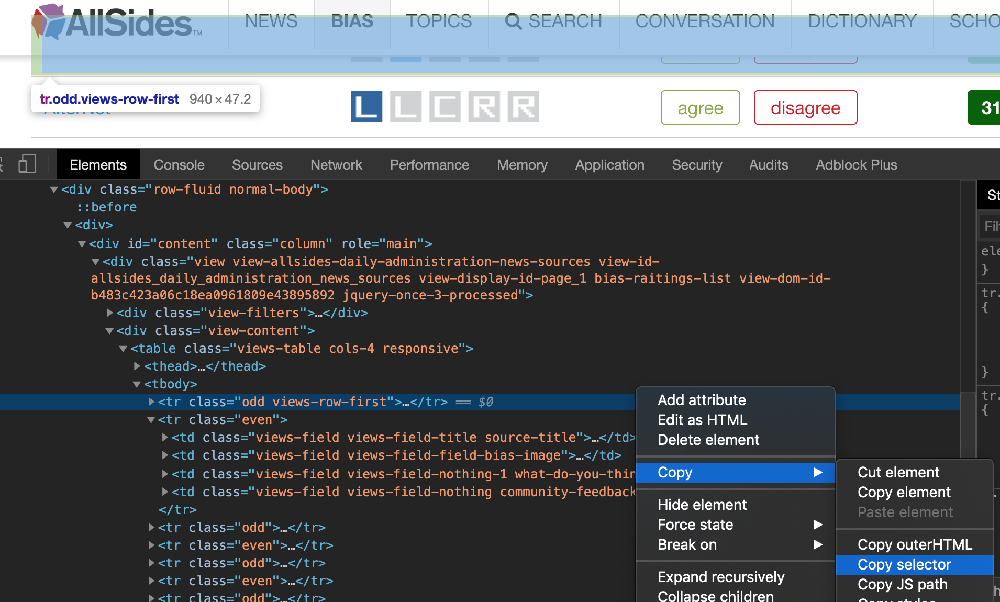

In [19]:
# Select the first row
selector = "#content > div > div.view-content > table > tbody > tr.odd.views-row-first"
soup.select(selector)

[<tr class="odd views-row-first">
 <td class="views-field views-field-title source-title">
 <a href="/news-source/abc-news-media-bias">ABC News</a> </td>
 <td class="views-field views-field-field-bias-image">
 <a href="/media-bias/left-center"><img alt="Political News Media Bias Rating: Lean Left" height="24" src="https://www.allsides.com/sites/default/files/styles/bias144x24/public/bias-leaning-left.png?itok=mtG3ToEN" title="Political News Media Bias Rating: Lean Left" typeof="foaf:Image" width="144"/></a> </td>
 <td class="views-field views-field-nothing-1 what-do-you-think">
 <div class="agree-disagree-widget"><div class="rate-widget-4 rate-widget clear-block rate-average rate-widget-yesno rate-f13adc4a6caee57d894f9d7ef192d7f3 rate-node-76-4-1" id="rate-node-76-4-1">
 <div class="item-list"><ul><li class="first"><a class="rate-button rate-btn" href="/media-bias/media-bias-ratings?rate=zmyDLixxBj_ytZsb_p9D32b0gPWtDEaeOSu_YIdkTIc" id="rate-button-3" rel="nofollow" title="agree">agree<

## But we need all of the rows!

Generalize the selector to just select all `<tr>` tags within the `<tbody>` tag

In [20]:
# Get all tr tags within the tbody tag
rows = soup.select('tbody tr')

In [21]:
len(rows)

20

In [22]:
# get the first row
row = rows[0]
print(row)

<tr class="odd views-row-first">
<td class="views-field views-field-title source-title">
<a href="/news-source/abc-news-media-bias">ABC News</a> </td>
<td class="views-field views-field-field-bias-image">
<a href="/media-bias/left-center"><img alt="Political News Media Bias Rating: Lean Left" height="24" src="https://www.allsides.com/sites/default/files/styles/bias144x24/public/bias-leaning-left.png?itok=mtG3ToEN" title="Political News Media Bias Rating: Lean Left" typeof="foaf:Image" width="144"/></a> </td>
<td class="views-field views-field-nothing-1 what-do-you-think">
<div class="agree-disagree-widget"><div class="rate-widget-4 rate-widget clear-block rate-average rate-widget-yesno rate-f13adc4a6caee57d894f9d7ef192d7f3 rate-node-76-4-1" id="rate-node-76-4-1">
<div class="item-list"><ul><li class="first"><a class="rate-button rate-btn" href="/media-bias/media-bias-ratings?rate=zmyDLixxBj_ytZsb_p9D32b0gPWtDEaeOSu_YIdkTIc" id="rate-button-3" rel="nofollow" title="agree">agree</a></li>

## Extracting the outlet name

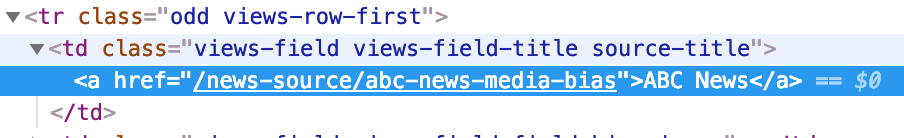

In [23]:
# get the text from the "a" tag inside the ".source-title" class
name = row.select_one('.views-field.source-title a').text
print(name)

ABC News


In [26]:
# could also select only using the "source-title" class
row.select_one('.source-title a').text

'ABC News'

## Extracting the outlet bias 

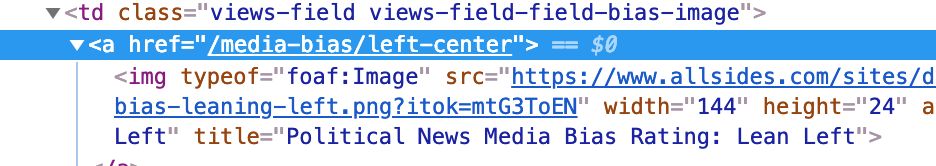

In [29]:
row.select_one('.views-field-field-bias-image a')['href']

'/media-bias/left-center'

In [31]:
# select tag with class "views-field-field-bias-image"
# and then get the "href" attribute of the a element

bias = row.select_one('.views-field-field-bias-image a')['href']
print(bias)
bias = bias.split('/')[-1]
print(bias)

/media-bias/left-center
left-center


## Exercise

1. Loop over all rows and make a DataFrame of name and bias
1. Use seaborn to make a bar plot of the number of outlets for each bias type

In [36]:
import pandas as pd

In [32]:
names = []
biases = []

def get_bias(row):
    bias = row.select_one('.views-field-field-bias-image a')['href']
    return bias.split('/')[-1]

def get_name(row):
    return row.select_one('.source-title a').text

for this_row in rows:
    this_name = get_name(this_row)
    this_bias = get_bias(this_row)
    
    names.append(this_name)
    biases.append(this_bias)

In [34]:
biases

['left-center',
 'left',
 'right',
 'center',
 'center',
 'center',
 'right',
 'left',
 'left-center',
 'center',
 'left-center',
 'left',
 'left',
 'right',
 'left',
 'center',
 'right-center',
 'right',
 'left',
 'left']

In [37]:
data = {'name':names, 'bias':biases}
df = pd.DataFrame(data)

In [38]:
df.head()

,name,bias
0,ABC News,left-center
1,AlterNet,left
2,American Spectator,right
3,Associated Press,center
4,BBC News,center


## Let's plot the results

In [39]:
import seaborn as sns
import matplotlib as plt
%matplotlib inline

In [40]:
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['font.size'] = 16

In [42]:
N

bias
center          5
left            7
left-center     3
right           4
right-center    1
dtype: int64

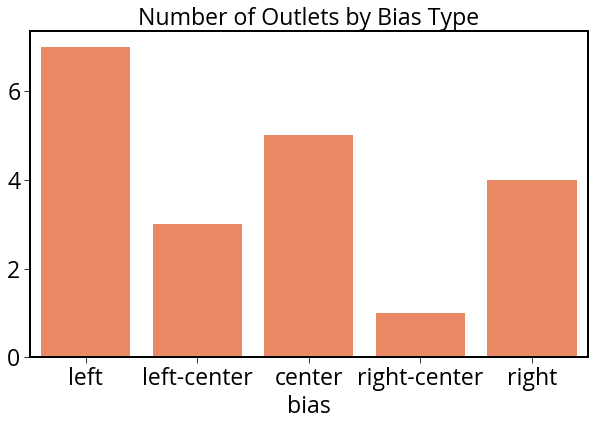

In [41]:
# group by bias
N = df.groupby("bias").size()

# make a bar plot, ordering the x axis
ax = sns.barplot(
    x=N.index,
    y=N,
    color="coral",
    order=["left", "left-center", "center", "right-center", "right"],
)
ax.set_title("Number of Outlets by Bias Type")

In [43]:
#the right 
df.loc[df['bias'] == 'right']

,name,bias
2,American Spectator,right
6,Breitbart News,right
13,Daily Mail,right
17,Fox News Opinion,right


In [44]:
# the left
df.loc[df['bias'] == 'left']

,name,bias
1,AlterNet,left
7,BuzzFeed News,left
11,CNN - Editorial,left
12,Daily Beast,left
14,Democracy Now,left
18,HuffPost,left
19,Mother Jones,left


## A few more exercises to practice your skills

Even more: [101 Web Scraping Exercises](https://github.com/stanfordjournalism/search-script-scrape)

For each of the exercises, use the Web Inspector to inspect the structure of the relevant web page, and identify the HTML content you will need to scrape with Python.

### The total number of officer-involved shootings listed by the Philadelphia Police

Relevant URL: https://www.phillypolice.com/ois/

In [53]:
url = "https://www.phillypolice.com/ois/"
soup = BeautifulSoup(requests.get(url).content, 'html.parser')

In [73]:
url = "https://www.phillypolice.com/ois/"
soup = BeautifulSoup(requests.get(url).content, 'html.parser')
total_shootings = 0

# select all tables
all_tables = soup.select('.ois-table')

# loop over each table
for table in all_tables:
    
    # select all rows in this specific table
    rows = table.select('tr')
    
    # dont count the header!
    total_shootings = total_shootings + len(rows) - 1
    
print(f"total number of shootings = {total_shootings}")

total number of shootings = 467


### The latest population of Philadelphia, according to the Census

Relevant URL: https://www.census.gov/quickfacts/philadelphiacountypennsylvania

In [70]:
url = "https://www.census.gov/quickfacts/philadelphiacountypennsylvania"
soup = BeautifulSoup(requests.get(url).content, 'html.parser')

# Select the "td" element holding the Populaiton, using Edit > Copy > Copy Selector
selector = "#qfcontent > div.qf-facttable > div > table:nth-child(2) > tbody > tr.fact.selected > td:nth-child(2)"
population = soup.select_one(selector).text
print("Raw population value = ", population)

# Format -> remove extra characters and commas
population = float(population.strip().replace(',', ''))
print(f"Population of Philadelphia = {population}")

Raw population value =  
1,584,138
Population of Philadelphia = 1584138.0


### The number of potholes filled by the Streets Dept since Jan 1, 2019

Relevant URL: https://www.philadelphiastreets.com/

**Bonus:** calculate the number of potholes filled per day (for calculating the number of days between dates, see [this StackOverflow post](https://stackoverflow.com/questions/151199/how-to-calculate-number-of-days-between-two-given-dates)

In [72]:
url = "https://www.philadelphiastreets.com/"
soup = BeautifulSoup(requests.get(url).content, 'html.parser')

# use the exact CSS selector: use Edit > Copy > Copy Selector
div = soup.select_one("#rw_home_right > a > div > h3:nth-child(1)")

potholes = int(div.text.replace(",", ""))
print(potholes)

47232


In [64]:
from datetime import date

d0 = date(2019, 1, 1)
delta = (date.today() - d0).days
print("number of potholes filled per day = ", potholes/delta)

number of potholes filled per day =  171.75272727272727


### Food inspections in Philadelphia

Extract the following: 
- the names and number of violations per inspection for food-borne risk factors (as a DataFrame)
- the total number of violations

**Note: we are looking for food-borne violations only, and not all restaurants listed will have food-borne violations listed**

Relevant URL: http://data.inquirer.com/inspections/philly/

In [75]:
# Parse the HTML
url = "http://data.inquirer.com/inspections/philly/"
soup = BeautifulSoup(requests.get(url).content, 'html.parser')

# This will select all rows of the table
rows = soup.select("div.inspectionUnitInner")

In [76]:
# Keep track of the restaurant names and violations
data = {}
data['name'] = []
data['violations'] = []

# Loop over each row
for row in rows:
    
    # The name of the restaurant
    name = row.select_one(".inspectionUnitName").text
    
    # The number of foodborne violations
    count = row.select_one(".inspectionUnitCountFoodborne .inspectionCountNumber")
    
    # Only save it if count was listed (0 violations will show up as None)
    if count is not None:
        data['name'].append(name)
        data['violations'].append(int(count.text))

df = pd.DataFrame(data)
df.head()

,name,violations
0,Bacalao Food Market,9
1,4 Every Occasion,3
2,Butcher Boys Meat Market,3
3,Crime and Punishment Brewing Co.,3
4,Grand Harvest House,3


In [68]:
print("total number of foodborne violations = ", df['violations'].sum())

total number of foodborne violations =  109


## What about dynamic content?

How do you scrape data that only appears after user interaction?

## Selenium

<center>
    <img src=attachment:Picture1.png width=700>
</center>
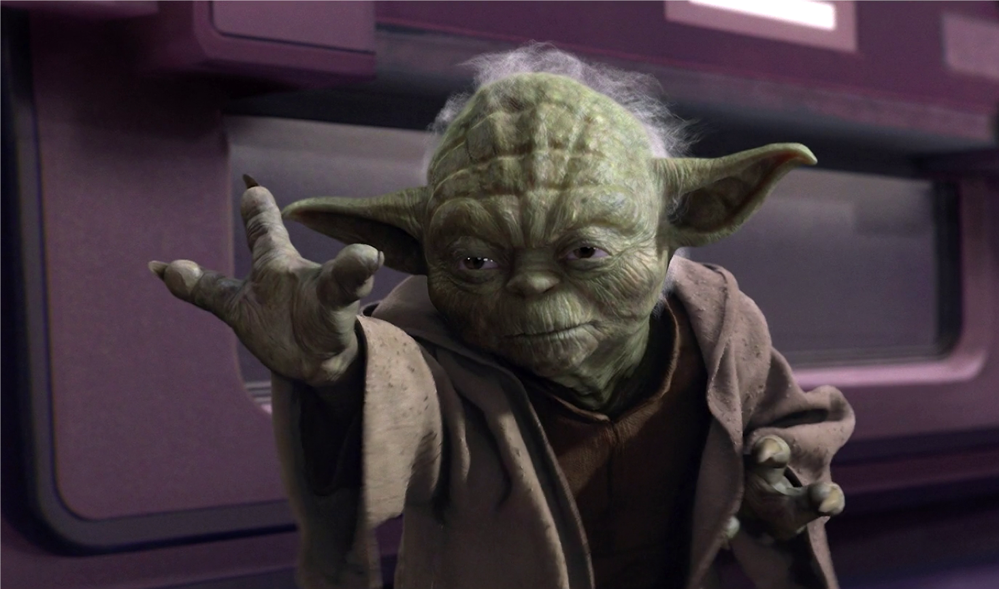

## First, we have to install it

- We can install `selenium` using Anaconda
- You will need FireFox or (the latest version of ) Google Chrome installed for it to work

If you updated your local environment with this week's environment file, all of the Python packages **should** be installed.

**This will not work on Binder.**

## Selenium 

- Designed as a framework for testing webpages during development
- Provides an interface to interact with webpages just as a user would 
- Becoming increasingly popular for web scraping dynamic content from pages

## Best by example: scraping the Inquirer's comment section

Comments are hidden by default, need to "Show Comments", and then scrape them.

We'll use a recent article on real estate flippers in gentrifying neighborhoods: https://www.inquirer.com/real-estate/housing/philadelphia-real-estate-flippers-gentrification-heirs-inheritance-20190927.html

Selenium will open a web browser, load the page, and the browser will respond to the commands issued by selenium

Need to specify Google Chrome or Firefox

In [77]:
# initialize the web browser
from selenium import webdriver
import chromedriver_binary

# Use Google Chrome 
driver = webdriver.Chrome()

# Could also use Firefox
#driver = webdriver.Firefox()

In [78]:
# Open the URL
url = "https://www.inquirer.com/real-estate/housing/philadelphia-real-estate-flippers-gentrification-heirs-inheritance-20190927.html"
driver.get(url)


## Select the "Show Comments" button and click it

**Note:** selenium can be a bit temperamental — sometimes you need to wait for a minute before trying it again

In [79]:
button = driver.find_element_by_class_name("article-comments-button")
button

<selenium.webdriver.remote.webelement.WebElement (session="4c97c5e86d21f0bb55fa3af0a613289c", element="1d7534c3-a3c2-4d32-a594-29e1e19036de")>

In [80]:
button.click()

## Now pass the page source to Beautiful Soup

Selenium's page source is XML rather than HTML so the syntax is slightly different

In [81]:
inq_soup = BeautifulSoup(driver.page_source, 'html.parser')

<html class="fa-events-icons-failed" lang="en-US">
 <head>
  <style id="vf-font-size-override">
   .viafoura { --base-font-size: 0.625rem; }
  </style>
  <script async="" src="https://sb.scorecardresearch.com/c2/6034697/cs.js" type="text/javascript">
  </script>
  <script src="https://d1z2jf7jlzjs58.cloudfront.net/code/ptrack-v1.3.1-engagedtime-slots.js">
  </script>
  <script async="" id="www-widgetapi-script" src="https://s.ytimg.com/yts/jsbin/www-widgetapi-vfl6mioSm/www-widgetapi.js" type="text/javascript">
  </script>
  <script async="" src="//cdn.keywee.co/dist/sp-2.9.1.js">
  </script>
  <script src="https://www.googletagservices.com/activeview/js/current/osd.js?cb=%2Fr20100101">
  </script>
  <script async="" src="//www.youtube.com/iframe_api" type="text/javascript">
  </script>
  <script src="https://srv-2019-10-03-23.config.parsely.com/config/philly.com">
  </script>
  <script async="" src="//static.chartbeat.com/js/chartbeat.js" type="text/javascript">
  </script>
  <script a
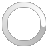

In [83]:
print(inq_soup.prettify())

## Select the comment elements

In [84]:
comments = inq_soup.select(".vf-comment-html-content")

In [85]:
comments

[<span class="vf-comment-html-content"> If the heirs want to make a real estate killing,  then they should fix up and flip the house themselves. If they cant/dont want to,  then why complain about someone who does? </span>,
 <span class="vf-comment-html-content"> Capitalism at its best. We need to upgrade these neighborhoods to tax paying households. The more the better. We have too many poor neighborhoods and not enough people who can to upgrade. Influx will help everyone. </span>,
 <span class="vf-comment-html-content"> Reply to @lls:  The heirs of these properties should call a lawyer, real estate agent or property appraiser to find out the current market value on the inherited properties.  What if they were contacted by a financial advisor telling them they inherited shares of Microsoft and were told they would give them $30 share and pay off the taxes when the current price is $130?  Wouldn't they look up the price in the newspaper or online?  Ignorance is no excuse. </span>,
 <sp

## Extract the comment text

In [86]:
cleaned = [c.text.strip().lower() for c in comments]

In [87]:
print(len(cleaned))

16


In [65]:
cleaned

['if the heirs want to make a real estate killing,  then they should fix up and flip the house themselves. if they cant/dont want to,  then why complain about someone who does?',
 'capitalism at its best. we need to upgrade these neighborhoods to tax paying households. the more the better. we have too many poor neighborhoods and not enough people who can to upgrade. influx will help everyone.',
 "reply to @lls:  the heirs of these properties should call a lawyer, real estate agent or property appraiser to find out the current market value on the inherited properties.  what if they were contacted by a financial advisor telling them they inherited shares of microsoft and were told they would give them $30 share and pay off the taxes when the current price is $130?  wouldn't they look up the price in the newspaper or online?  ignorance is no excuse.",
 'reply to @lls: fair market value is whatever price the buyer and seller voluntarily agree on.  as others have pointed out - the sellers h

## Next Steps (if you are up and running)

- Only 14 comments, not 43 — more buttons! 
- Identify the selector for the "Show More" and "click" it as many times as needed until all of the comments are loaded
- Parse and extract the comment text
- Pass the text to `textblob` and do a quick sentiment analysis on the comments. Identify the top 10 most polarized comments (the 10 comments with the most negative polarity values)

## Click the "Show More" button

In [90]:
driver.find_element_by_css_selector(".vf-load-more").click()

ElementNotInteractableException: Message: element not interactable
  (Session info: chrome=77.0.3865.90)


In [91]:
inq_soup = BeautifulSoup(driver.page_source, 'html.parser')
comments = inq_soup.select(".vf-comment-html-content")
cleaned = [c.text.strip().lower() for c in comments]

In [92]:
len(comments)

36

## Sentiment analysis

In [93]:
import textblob

## Make a DataFrame of polarity/subjectivity

In [94]:
blobs = [textblob.TextBlob(c) for c in cleaned]
df = pd.DataFrame(
    {
        "text": cleaned,
        "polarity": [b.sentiment.polarity for b in blobs],
        "subjectivity": [b.sentiment.subjectivity for b in blobs],
    }
)

In [95]:
df.head()

,text,polarity,subjectivity
0,if the heirs want to make a real estate killin...,0.2000,0.300000
1,capitalism at its best. we need to upgrade the...,0.3500,0.483333
2,reply to @lls: the heirs of these properties ...,0.0450,0.230000
3,reply to @lls: fair market value is whatever p...,0.4375,0.458333
4,before you sell....use your brains. \nget a...,0.3000,0.100000


## The top 10 most polarized comments

In [96]:
# sort by polarity
df = df.sort_values('polarity', ascending=True)

for i in range(10): 
    print("Number #%d" %(i+1))
    print(df['polarity'].iloc[i])
    print(df['text'].iloc[i])

Number #1
-0.7666666666666666
with trump & company gone, these racist scum will be brought to justice.  evil knows where evil sleeps.
Number #2
-0.4
i think "poorly informed" comes before "poor".
Number #3
-0.30000000000000004
the way america is united on screwing the poor and disabled citizens.
Number #4
-0.16666666666666666
reply to @jarhead: the people being duped are obviously not in a position to know how to protect themselves, realize an appraisal is prudent, or pay the hundreds of dollars to acquire one. your common sense and empathy seem to be entirely missing, jarhead.
Number #5
-0.15
reply to @lls: "common sense" is checking the value of your property before you sell it to someone calling you out of the blue.
Number #6
-0.10833333333333332
reply to @edh: agreed.  how can adults be so naive?  if someone offers to buy something from you that you didn't know you had, hit pause and do your due dilligence.
Number #7
-0.07777777777777779
surly their is a percentage of folks who wer

## A histogram of comment polarity

Use matplotlib to plot a histogram of the comment polarity values

In [98]:
from matplotlib import pyplot as plt

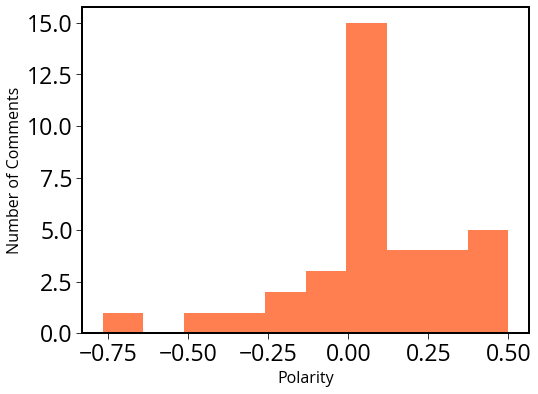

In [99]:
fig, ax = plt.subplots(figsize=(8,6))

ax.hist(df.polarity, bins='auto', color='coral')
ax.set_xlabel("Polarity", fontsize=16)
ax.set_ylabel("Number of Comments", fontsize=16);

In [100]:
driver.close()